<a href="https://colab.research.google.com/github/snaheen/project_5/blob/master/Stop_words_and_Punctuation_Removal_%2B_Word_cloud.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#import basic libraries
import sklearn
import numpy as np
import pandas as pd

# **Stopwords Removal**

In [2]:
#Importing stopwords from nltk library
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
STOPWORDS = set(stopwords.words('english'))
def stopwords_f(text):
  return " ".join([word for word in str(text).split() if word not in STOPWORDS])

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# **Emoji and Emoticon Removal**

In [3]:
# function to remove emoji
import re

def remove_emoji(string):
    emoji_pattern = re.compile("["u"\U0001F600-\U0001F64F"  # emoticons
                                  u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                                  u"\U0001F680-\U0001F6FF"  # transport & map symbols
                                  u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                                  u"\U00002702-\U000027B0"
                                  u"\U000024C2-\U0001F251""]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', string)

In [4]:
# function for removing emoticons
!pip install emot
import emot
from emot.emo_unicode import UNICODE_EMO, EMOTICONS
def remove_emoticons(text):
         emoticon_pattern = re.compile(u'(' + u'|'.join(k for k in EMOTICONS) + u')')
         return emoticon_pattern.sub(r'', text)

# **Visualisation**

**Plot function**

In [5]:
# Import packages
import matplotlib.pyplot as plt
%matplotlib inline
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off")
    # Plot padding
    plt.tight_layout(pad = 0) 

In [6]:
#Import package
from wordcloud import WordCloud, STOPWORDS

# **Loop for all the CSV**

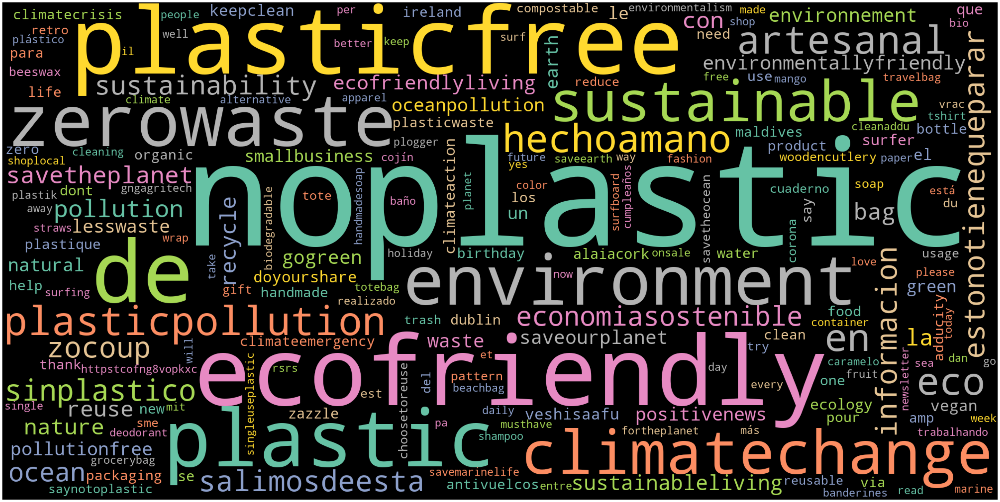

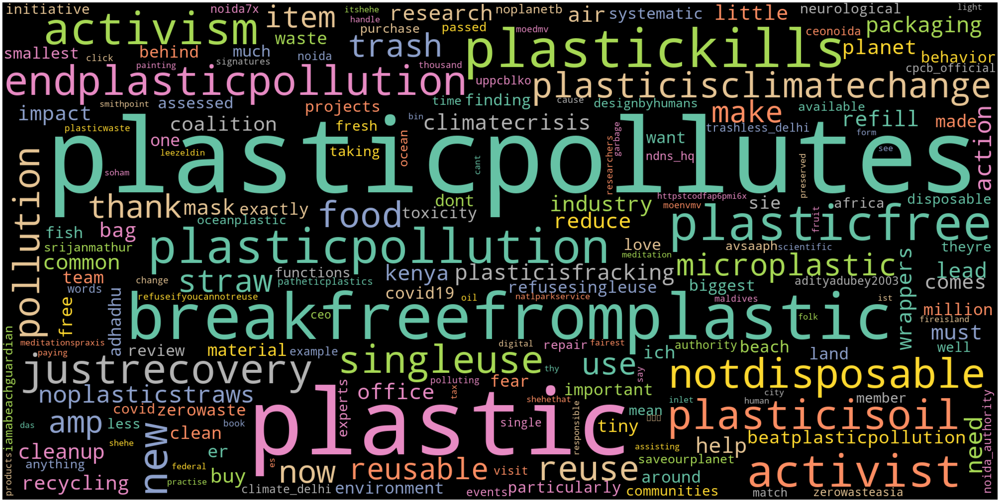

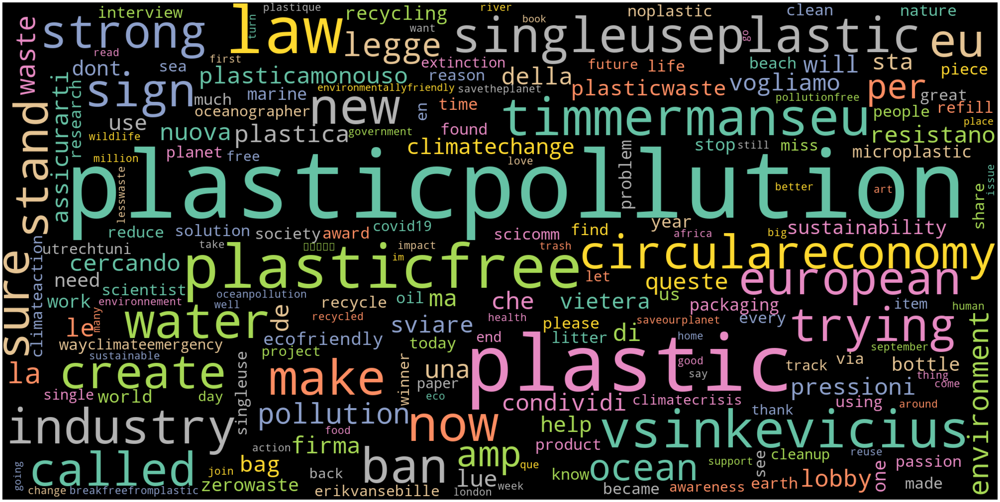

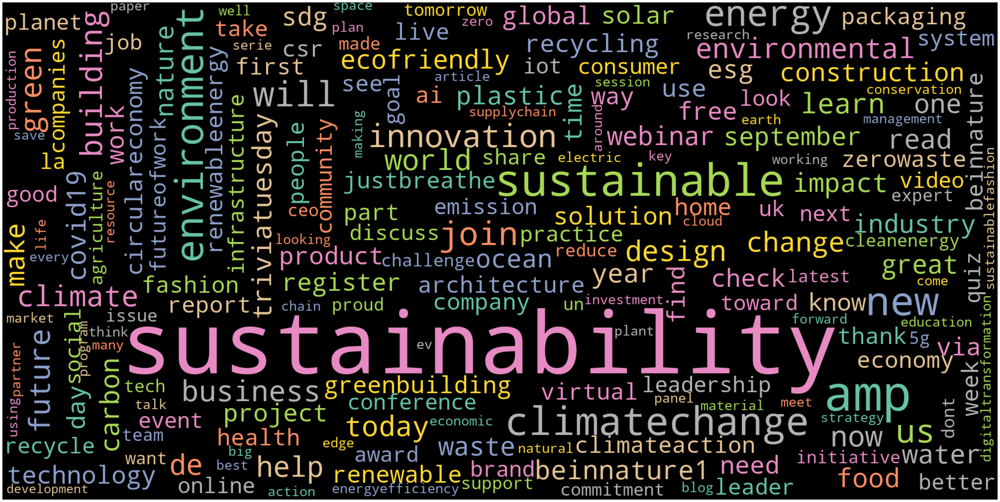

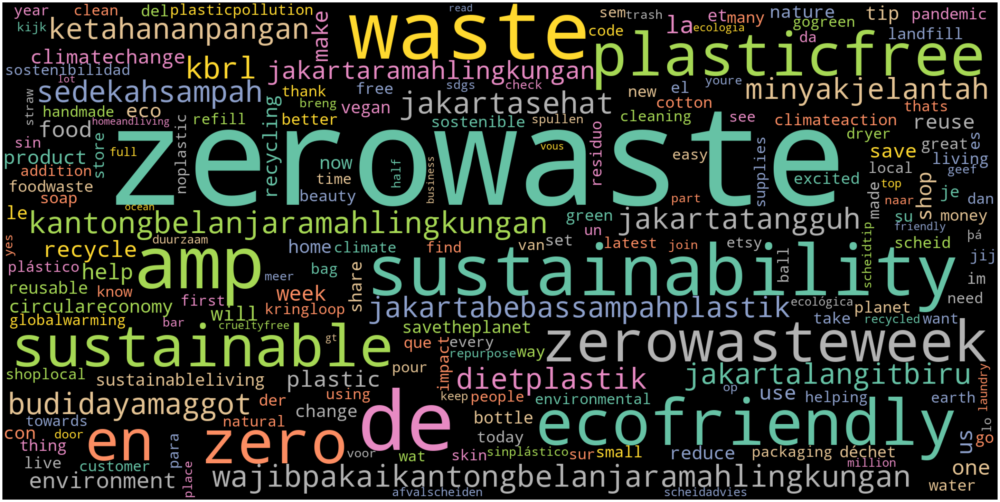

In [7]:
filenames = ['noplastic.csv', 'plasticpollutes.csv', 'plasticpollution2.csv', 'sustainability.csv', 'zerowaste.csv' ]
for f in filenames:
      df = pd.read_csv(f)
      df = df [['created_at', 'full_text', 'user']]

      df["text_lower"] = df['full_text'].str.lower()
      df['text_punct'] = df ['text_lower'].str.replace('[^\w\s]','')
     
      df["text_stop"] = df["text_punct"].apply(stopwords_f)
      df['text_stop'] = df['text_stop'].apply(remove_emoji)
      
      df['text_stop'] = df['text_stop'].apply(remove_emoticons)

      df.to_csv('updated_{}'.format(f))

      # iterate through the csv file 
      text = ''
      for val in df['text_stop']:  
          val = str(val)  
          tokens = val.split() 
          for i in range(len(tokens)): 
            tokens[i] = tokens[i].lower() 
            text += " ".join(tokens)+" "

      # Generate word cloud
      wordcloud = WordCloud(width = 2000, height = 1000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = STOPWORDS).generate(text)
      # Plot
      plot_cloud(wordcloud)
      #Save image
      wordcloud.to_file("{}_wordcloud.png".format(f))


## Data Exploration
Checking for missing values

In [8]:
data = pd.read_csv('updated_zerowaste.csv')
data.head()

,Unnamed: 0,created_at,full_text,user,text_lower,text_punct,text_stop
0,0,2020-09-10 19:56:08+00:00,This needs to happen!! Wouldn’t trust ⁦@10Down...,"{'id': 465927505, 'id_str': '465927505', 'name...",this needs to happen!! wouldn’t trust ⁦@10down...,this needs to happen wouldnt trust 10downingst...,needs happen wouldnt trust 10downingstreet pet...
1,1,2020-09-10 19:50:05+00:00,"Thank you to our supporters! Each month, you h...","{'id': 2372750060, 'id_str': '2372750060', 'na...","thank you to our supporters! each month, you h...",thank you to our supporters each month you hel...,thank supporters month help us rescue fresh pe...
2,2,2020-09-10 19:47:09+00:00,Hi twitter👋 I made a climate blog! My first po...,"{'id': 838857379278127105, 'id_str': '83885737...",hi twitter👋 i made a climate blog! my first po...,hi twitter i made a climate blog my first post...,hi twitter made climate blog first post discus...
3,3,2020-09-10 19:47:00+00:00,How have small businesses coped with lockdown ...,"{'id': 1096009570240159745, 'id_str': '1096009...",how have small businesses coped with lockdown ...,how have small businesses coped with lockdown ...,small businesses coped lockdown covid19 pandem...
4,4,2020-09-10 19:46:26+00:00,"Somebody come get her, she’s giving away like ...","{'id': 1087138093080096768, 'id_str': '1087138...","somebody come get her, she’s giving away like ...",somebody come get her shes giving away like a ...,somebody come shes giving away giver ig zerowa...


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 302 entries, 0 to 301
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  302 non-null    int64 
 1   created_at  302 non-null    object
 2   full_text   302 non-null    object
 3   user        300 non-null    object
 4   text_lower  302 non-null    object
 5   text_punct  302 non-null    object
 6   text_stop   302 non-null    object
dtypes: int64(1), object(6)
memory usage: 16.6+ KB


In [10]:
data.isnull().sum()

Unnamed: 0    0
created_at    0
full_text     0
user          2
text_lower    0
text_punct    0
text_stop     0
dtype: int64